# US Accident Anaysis

## Introduction
The data from this analysis is from [kaggle US Accidents: A Countrywide Traffic Accident Dataset (2016 - 2019)](https://www.kaggle.com/sobhanmoosavi/us-accidents), which contains accident data are collected from February 2016 to December 2019 in 49 US states, more documentation about this data can be found [here](https://smoosavi.org/datasets/us_accidents).

The purpose of this analysis is to analyze the data and find out what are the key variables that impact the **severity** of the traffic accidents that happened in US and ultimately predict the severity of the accidents based on given variables through **data visulization** and **regression analysis** using Python.

## Loading data

The analysis starts with loading data and necessary library.

In [46]:
# Load necessary library
import os
import pandas as pd
import numpy as np
import math
import datetime
from datetime import timedelta
import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter
import matplotlib.ticker as mtick
import seaborn as sns
import folium
import branca.colormap as cm
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.metrics import confusion_matrix
import geopandas as gpd
import warnings
warnings.filterwarnings('ignore')
plt.style.use('seaborn')
%matplotlib inline

plt.rcParams["figure.figsize"] = (15,8)

Previewing the data and some summary statistics

In [47]:
# Load and preview data 
accident = pd.read_csv("/Users/leo/Personal/GitHub/US_Accident_Analysis/US_Accidents_Dec19.csv")
accident.head()

,ID,Source,TMC,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,MapQuest,201.0,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,NaN,NaN,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,MapQuest,201.0,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,NaN,NaN,...,False,False,False,False,False,False,Night,Night,Night,Day
2,A-3,MapQuest,201.0,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,NaN,NaN,...,False,False,False,False,True,False,Night,Night,Day,Day
3,A-4,MapQuest,201.0,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,NaN,NaN,...,False,False,False,False,False,False,Night,Day,Day,Day
4,A-5,MapQuest,201.0,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,NaN,NaN,...,False,False,False,False,True,False,Day,Day,Day,Day


In [48]:
# Summary Statistics
accident.describe()

,TMC,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Number,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,2.246264e+06,2.974335e+06,2.974335e+06,2.974335e+06,728071.000000,728071.000000,2.974335e+06,1.056730e+06,2.918272e+06,1.121712e+06,2.915162e+06,2.926193e+06,2.908644e+06,2.533495e+06,975977.000000
mean,2.078316e+02,2.360190e+00,3.649361e+01,-9.542625e+01,37.580871,-99.976032,2.855654e-01,5.837004e+03,6.235120e+01,5.132685e+01,6.540542e+01,2.983190e+01,9.150770e+00,8.298064e+00,0.020495
std,2.032959e+01,5.414733e-01,4.918849e+00,1.721881e+01,5.004757,18.416647,1.548392e+00,1.515928e+04,1.878855e+01,2.519127e+01,2.255676e+01,7.213808e-01,2.892114e+00,5.138546e+00,0.235770
min,2.000000e+02,1.000000e+00,2.455527e+01,-1.246238e+02,24.570110,-124.497829,0.000000e+00,0.000000e+00,-7.780000e+01,-6.590000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000
25%,2.010000e+02,2.000000e+00,3.355040e+01,-1.172920e+02,33.957554,-118.286610,0.000000e+00,8.370000e+02,5.000000e+01,3.200000e+01,4.900000e+01,2.982000e+01,1.000000e+01,4.600000e+00,0.000000
50%,2.010000e+02,2.000000e+00,3.584969e+01,-9.025083e+01,37.903670,-96.631690,0.000000e+00,2.717000e+03,6.440000e+01,5.400000e+01,6.700000e+01,2.998000e+01,1.000000e+01,7.000000e+00,0.000000
75%,2.010000e+02,3.000000e+00,4.037026e+01,-8.091891e+01,41.372630,-82.323850,1.000000e-02,7.000000e+03,7.600000e+01,7.300000e+01,8.400000e+01,3.011000e+01,1.000000e+01,1.040000e+01,0.000000
max,4.060000e+02,4.000000e+00,4.900220e+01,-6.711317e+01,49.075000,-67.109242,3.336300e+02,9.999997e+06,1.706000e+02,1.150000e+02,1.000000e+02,3.304000e+01,1.400000e+02,8.228000e+02,25.000000


Checking Columns for nas

In [49]:
# Check each column for nas
accident.isnull().sum()

ID                             0
Source                         0
TMC                       728071
Severity                       0
Start_Time                     0
End_Time                       0
Start_Lat                      0
Start_Lng                      0
End_Lat                  2246264
End_Lng                  2246264
Distance(mi)                   0
Description                    1
Number                   1917605
Street                         0
Side                           0
City                          83
County                         0
State                          0
Zipcode                      880
Country                        0
Timezone                    3163
Airport_Code                5691
Weather_Timestamp          36705
Temperature(F)             56063
Wind_Chill(F)            1852623
Humidity(%)                59173
Pressure(in)               48142
Visibility(mi)             65691
Wind_Direction             45101
Wind_Speed(mph)           440840
Precipitat

Cleanning the data by removing unnecessary columns that won't be used in the analysis. Then review the cleaned dataset

In [50]:
# Exclude unnecessary columns
exclude = ["TMC","End_Lat","End_Lng","Description","Number","Street","Timezone",
           "Airport_Code","Weather_Timestamp","Civil_Twilight","Nautical_Twilight","Astronomical_Twilight"]
accident_clean = accident.drop(exclude,axis=1)
accident_clean.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Distance(mi),Side,City,...,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset
0,A-1,MapQuest,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,0.01,R,Dayton,...,False,False,False,False,False,False,False,False,False,Night
1,A-2,MapQuest,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,0.01,L,Reynoldsburg,...,False,False,False,False,False,False,False,False,False,Night
2,A-3,MapQuest,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,0.01,R,Williamsburg,...,False,False,False,False,False,False,False,True,False,Night
3,A-4,MapQuest,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,0.01,R,Dayton,...,False,False,False,False,False,False,False,False,False,Night
4,A-5,MapQuest,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,0.01,R,Dayton,...,False,False,False,False,False,False,False,True,False,Day


In [51]:
# Check nas after excluding unnecessary columns
accident_clean.isnull().sum()

ID                         0
Source                     0
Severity                   0
Start_Time                 0
End_Time                   0
Start_Lat                  0
Start_Lng                  0
Distance(mi)               0
Side                       0
City                      83
County                     0
State                      0
Zipcode                  880
Country                    0
Temperature(F)         56063
Wind_Chill(F)        1852623
Humidity(%)            59173
Pressure(in)           48142
Visibility(mi)         65691
Wind_Direction         45101
Wind_Speed(mph)       440840
Precipitation(in)    1998358
Weather_Condition      65932
Amenity                    0
Bump                       0
Crossing                   0
Give_Way                   0
Junction                   0
No_Exit                    0
Railway                    0
Roundabout                 0
Station                    0
Stop                       0
Traffic_Calming            0
Traffic_Signal

To prepare the dataset for further analysis, some additional columns are added

- Time_Diff: Time difference between start time and end time of the accident
- Year: Year of start time
- Month: Month of start time
- Day: Day of start time
- Hour: Hour of start time

During this step, also excluded records in 2015 and 2020 where there aren't enough data in these two years. This should give us a relatively clean dataset to start the analysis.

In [52]:
# Adding calculation of time difference of start and end time in minutes
accident_clean.Start_Time = pd.to_datetime(accident_clean.Start_Time)
accident_clean.End_Time = pd.to_datetime(accident_clean.End_Time)
accident_clean["Time_Diff"] = (accident_clean.End_Time - accident_clean.Start_Time).astype('timedelta64[m]')

accident_clean["Start_Date"] = accident_clean["Start_Time"].dt.date
accident_clean["End_Date"] = accident_clean["End_Time"].dt.date
accident_clean["Year"] = accident_clean["Start_Time"].dt.year
accident_clean["Month"] = accident_clean["Start_Time"].dt.month
accident_clean["Day"] = accident_clean["Start_Time"].dt.day
accident_clean["Hour"] = accident_clean["Start_Time"].dt.hour

# Excluding accidents in 2015 and 2020 where there's not enough data
accident_clean = accident_clean[(accident_clean["Year"] > 2015) & (accident_clean["Year"] < 2020)]
group = accident_clean.groupby(["Year"]).agg(Count = ('ID','count'))

# Verify data
accident_clean.head()

,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,Distance(mi),Side,City,...,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Time_Diff,Start_Date,End_Date,Year,Month,Day,Hour
0,A-1,MapQuest,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,0.01,R,Dayton,...,False,False,Night,314.0,2016-02-08,2016-02-08,2016,2,8,5
1,A-2,MapQuest,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,0.01,L,Reynoldsburg,...,False,False,Night,30.0,2016-02-08,2016-02-08,2016,2,8,6
2,A-3,MapQuest,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,0.01,R,Williamsburg,...,True,False,Night,30.0,2016-02-08,2016-02-08,2016,2,8,6
3,A-4,MapQuest,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,0.01,R,Dayton,...,False,False,Night,30.0,2016-02-08,2016-02-08,2016,2,8,7
4,A-5,MapQuest,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,0.01,R,Dayton,...,True,False,Day,30.0,2016-02-08,2016-02-08,2016,2,8,7


## Data Visualization

First group the data by **year** and **Severity** and use `size()` to count the records in each group, then use `unstack()` to pivot the result.

Most of the accidents falls under **Severity 2 and 3** and the number of accidents are increasing year over year.

In [53]:
# Examine data
accident_clean.groupby(["Year","Severity"]).size().unstack()

Severity,1,2,3,4
Year,,,,
2016,225,269847,126178,14350
2017,282,461971,231081,24149
2018,259,574016,292570,25770
2019,202,687573,237790,28065


Plot the data to visualize year over year traffic accident trend

<function matplotlib.pyplot.show(*args, **kw)>

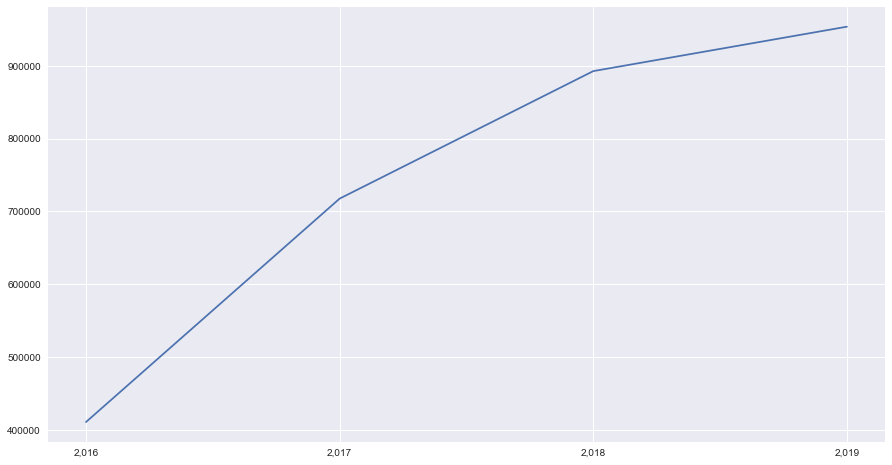

In [54]:
# accident_clean.groupby(["Start_Date","Severity"])["ID"].count()

# Group by year and Group by year and severity
group_year = accident_clean.groupby(["Year"]).agg(Count = ('ID','count'))
group_year_sev = accident_clean.groupby(["Year","Severity"]).size().unstack()

# YoY Total Accident Count
# fig = plt.figure(figsize=(15,8))

# plt.subplot(1, 2, 1)
plt.plot(group_year.index, group_year["Count"])
plt.gca().xaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.xticks(np.arange(2016, 2020, 1.0))

plt.show

Then plot the data by **Severity** and by **Year** to show the trend of accidents by year and by accident severity.

From the plot, we can see that:

- **Severity 2** accidents are *increasing* year over year in a rapid speed
- **Severity 3** accidents have seen a *decrease* in 2019 compared to 2018
- **Severity 1 and 4** are relatively flat year over year

<function matplotlib.pyplot.show(*args, **kw)>

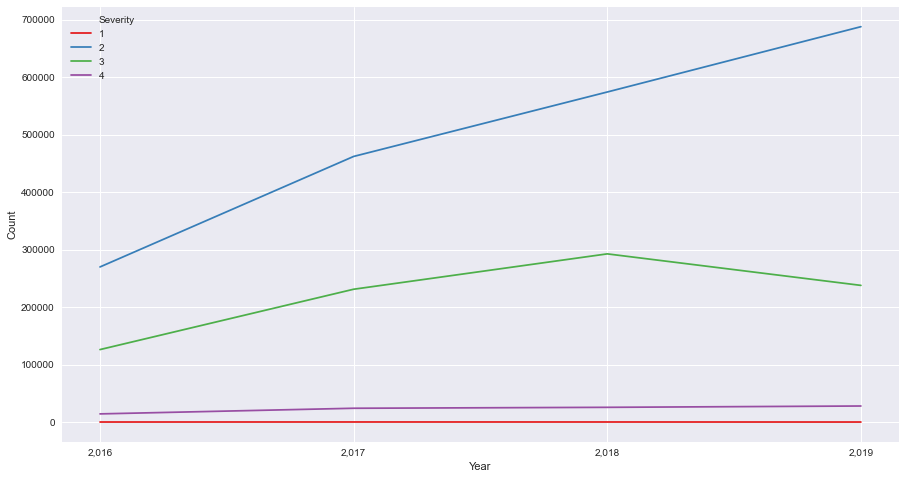

In [55]:
# YoY trend by severity, more in 2, 1 and 4 looks like flat, need to see in a bar plot
# fig = plt.figure(figsize=(15,8))
group_year_sev2 = accident_clean.groupby(["Year","Severity"]).agg(Count = ('ID','count')).reset_index()
sns.lineplot(x='Year',y='Count',hue="Severity",data=group_year_sev2,palette="Set1")
plt.gca().xaxis.set_major_formatter(StrMethodFormatter('{x:,.0f}'))
plt.xticks(np.arange(2016, 2020, 1.0))
plt.show

The following bar plots are also showing the similiar information then observed previously

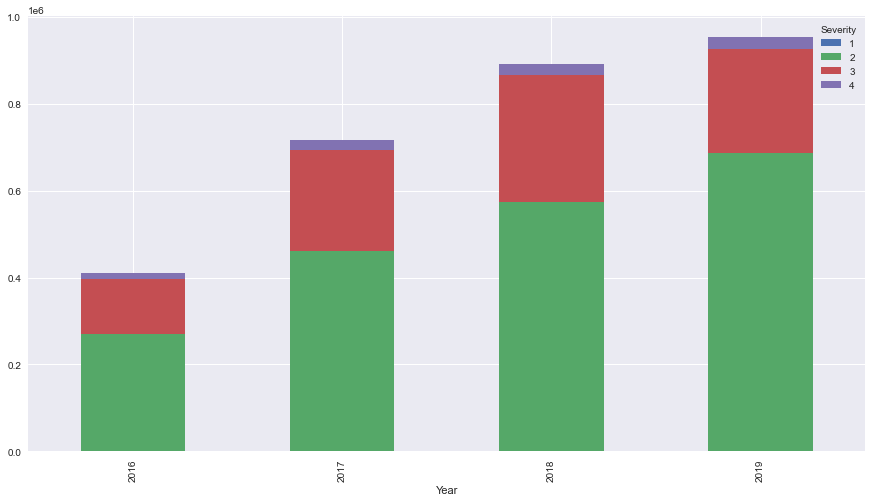

In [56]:
# YoY Severity Count
# group_year_sev = accident_clean.groupby(["Year","Severity"]).agg(Count = ('ID','count'))
# group_year_sev
accident_clean.groupby(["Year","Severity"]).size().unstack().plot(kind='bar',stacked=True)

The 100% stacked bar plot shows the % breakdown of each severity by year.

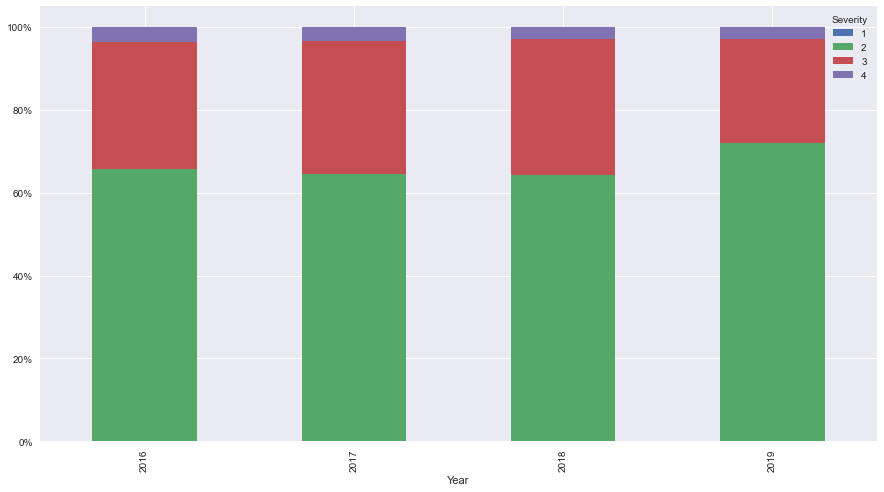

In [57]:
# Makes more sense to show stacked 100%, a different view
accident_clean.groupby(["Year","Severity"]).size().groupby(level=0).apply(
    lambda x: 100 * x / x.sum()
).unstack().plot(kind='bar',stacked=True)

plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter())
plt.legend(loc = 'upper right',title = 'Severity')
plt.show()

The dataset also contains some variables regarding the weather condition when the accidents happened. We also want to examine those variables to see if any of the weather related variables have impact on the severity of the accidents.

We want to use boxplot from `seaborn` library to see how the weather related variable changed in different type of accidents.

Below is a boxplot of **Temperature** and **Severity**, we can see that there are almost no difference in median temparature in Severity 1,2 and 3, while lower medium temperature in severity 4, which might indicate that lower temperature might result to more severe accidents.

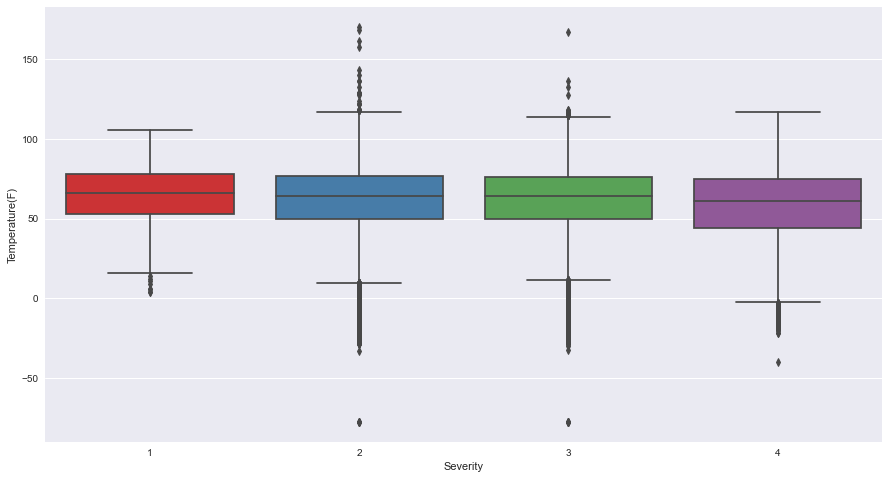

In [58]:
# Boxplot to show if temperature has impact on the severity of the accident, 
# looks like the more severe accident has lower temperature
sns.boxplot(x="Severity", y="Temperature(F)", data=accident_clean, palette="Set1")

Below is a boxplot of **Humidity** and **Severity**, similiarly, we can see that higher humidity might lead to more severe accidents.

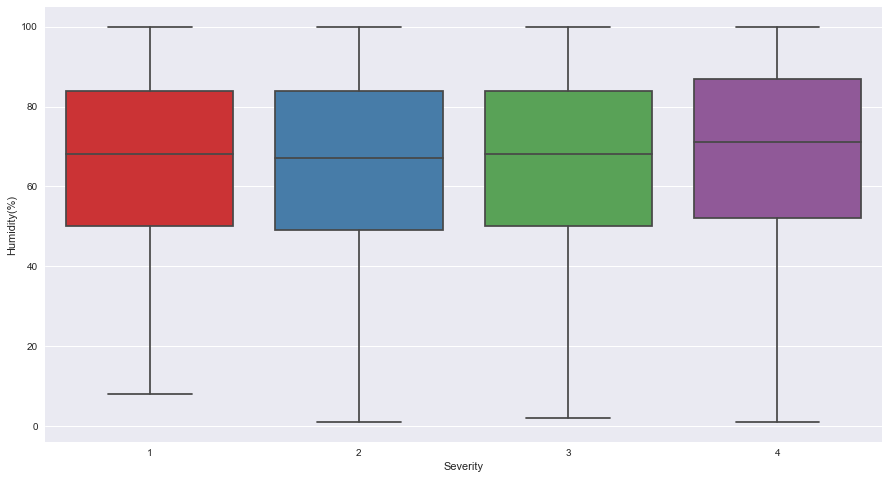

In [59]:
# Boxplot to show if temperature has impact on the severity of the accident, 
# looks like the more severe accident has lower temperature
sns.boxplot(x="Severity", y="Humidity(%)", data=accident_clean, palette="Set1")

Below is a boxplot of **Wind Chill** and **Severity**, similiarly, we can see that lower Wind Chill might lead to more severe accidents.

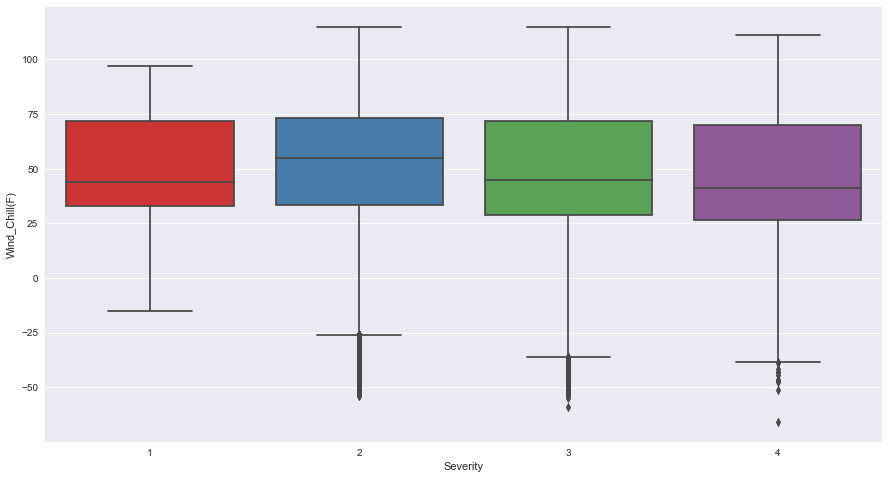

In [60]:
# Examine wind chill and accident severity, lower wind chill cause more severe accidents
sns.boxplot(x="Severity", y="Wind_Chill(F)", data=accident_clean, palette="Set1")

There are some other categorical variables that might have impact on the severity of the accidents, we are using `crosstab()` function to get a count of the accidents in each group

In [61]:
# Count of Severity by Sunrise_Sunset to see if more severe accidents happened at night
pd.crosstab(accident_clean["Severity"], accident_clean["Sunrise_Sunset"], 
            rownames=['Severity'], colnames=['Sunrise_Sunset'])

Sunrise_Sunset,Day,Night
Severity,,
1,720,248
2,1506022,487323
3,632551,255058
4,54791,37529


The 100% stacked barplot below indicates that more severe accidents are happening during the night then in the day time.

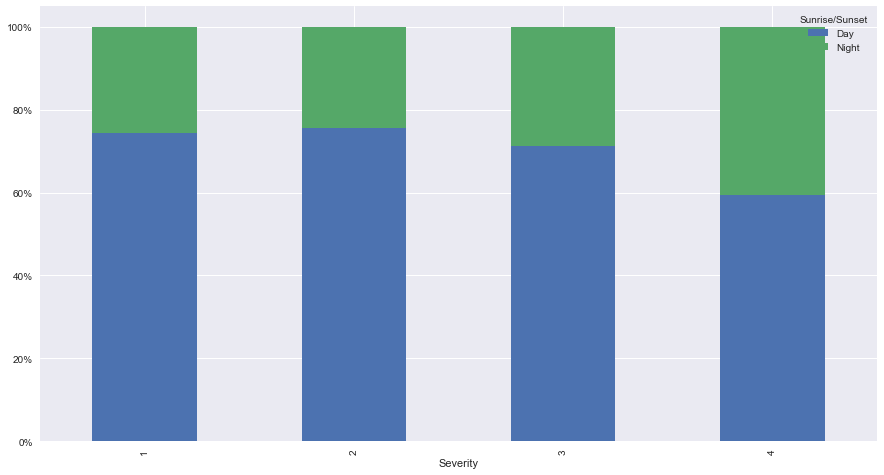

In [62]:
# Severity 1 and two has same % between day and night while 3 and 4 has more accidents % at nights
accident_clean.groupby(["Severity","Sunrise_Sunset"]).size().groupby(level=0).apply(
    lambda x: 100 * x / x.sum()
).unstack().plot(kind='bar',stacked=True)

plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter())
plt.legend(loc = 'upper right',title = 'Sunrise/Sunset')
plt.show()

The plot below shows that most accidents are happening on the **right** side of the road

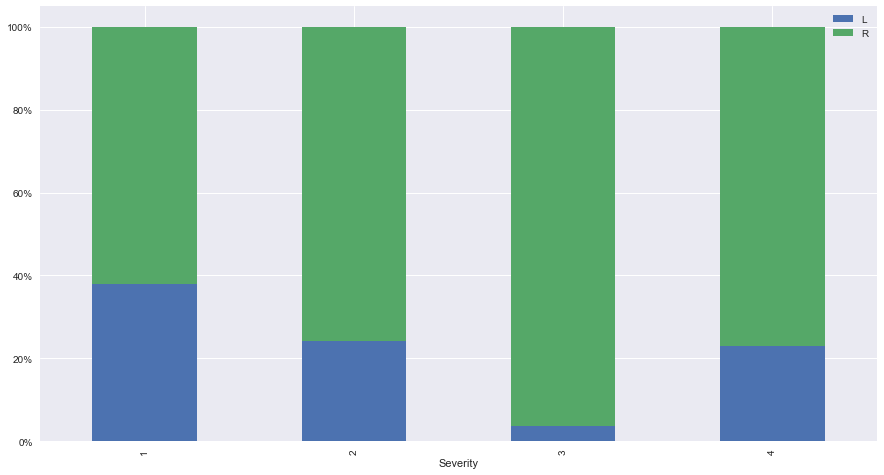

In [63]:
# Most accidents happened on the right side of the road
# Severity 3 has more on right then the left side of the road
accident_clean[accident_clean.Side != " "].groupby(["Severity","Side"]).size().groupby(level=0).apply(
    lambda x: 100 * x / x.sum()
).unstack().plot(kind='bar',stacked=True)
plt.legend(loc = 'upper right')
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter())
plt.show()

The plor below shows by month, the break down of the accidents by severity, more severe accidents (Severity 3 and 4) happened in June and July.

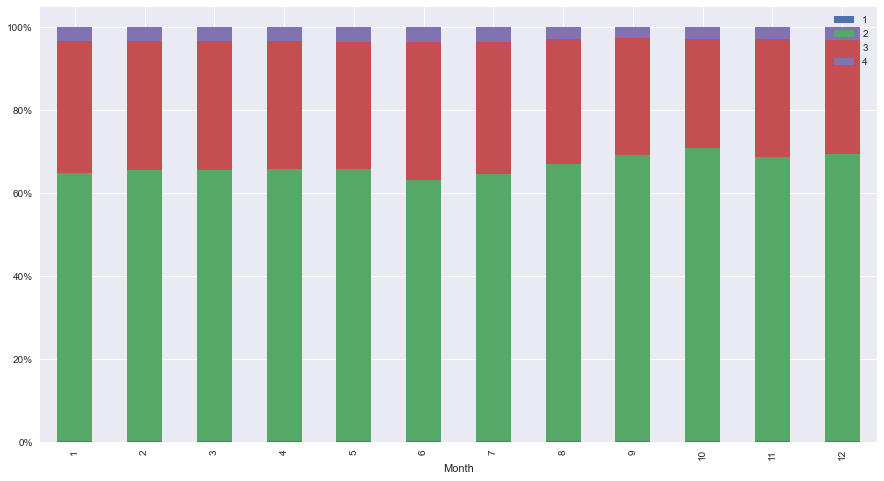

In [64]:
# Examining Severity by month, most severe accidents (3 and 4) happened in June and July
accident_clean.groupby(["Month","Severity"]).size().groupby(level=0).apply(
    lambda x: 100 * x / x.sum()
).unstack().plot(kind='bar',stacked=True,figsize = (15,8))
plt.legend(loc = 'upper right')
plt.gca().yaxis.set_major_formatter(mtick.PercentFormatter())
plt.show()

For numeric variables that are severely skewed, boxplot won't be a good interpretation visually, for those variables, we are using `groupby()` to get the mean by **Severity**

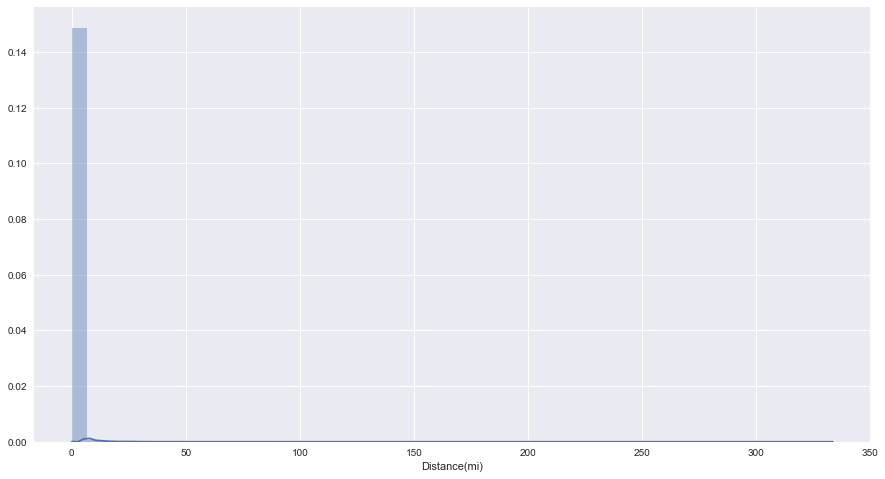

In [65]:
sns.distplot(accident_clean['Distance(mi)'])

In [66]:
accident_clean.groupby('Severity')['Distance(mi)'].mean()
# df[(df['year'] > 2012) & (df['reports'] < 30)]
# sns.boxplot(x="Severity", y="Wind_Speed(mph)", 
#             data=accident_clean[accident_clean["Wind_Speed(mph)"] <= 50], palette="Set1")

Severity
1    0.017965
2    0.168282
3    0.401946
4    1.701643
Name: Distance(mi), dtype: float64

In [67]:
accident_clean.groupby('Severity')['Time_Diff'].median()
# sns.boxplot(x="Severity", y="Time_Diff", data=accident_clean, palette="Set1")

Severity
1     30.0
2     44.0
3     34.0
4    360.0
Name: Time_Diff, dtype: float64

As expected, more severe accidents will affect longer distances and last longer time.

There are another set of variables that describes the condition of the road, wuch as whether there's a bump in the road, or whether there's traffic signal.

The following analysis will focus on these variables.

First select these variables and Severity into a new dataset called `accident road`.

In [68]:
accident_road = accident[['Severity','Amenity', 'Bump','Crossing','Give_Way',
                         'Junction','No_Exit','Railway','Roundabout','Station',
                         'Stop','Traffic_Calming','Traffic_Signal','Turning_Loop']]
accident_road.head()

,Severity,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop
0,3,False,False,False,False,False,False,False,False,False,False,False,False,False
1,2,False,False,False,False,False,False,False,False,False,False,False,False,False
2,2,False,False,False,False,False,False,False,False,False,False,False,True,False
3,3,False,False,False,False,False,False,False,False,False,False,False,False,False
4,2,False,False,False,False,False,False,False,False,False,False,False,True,False


In order to plot these variables in the same grid, we used `melt()` and then `groupby()` to reshape the dataset.

In [69]:
accident_road_melt = pd.melt(accident_road,id_vars =['Severity'],value_vars=['Amenity', 'Bump','Crossing','Give_Way',
                         'Junction','No_Exit','Railway','Roundabout','Station',
                         'Stop','Traffic_Calming','Traffic_Signal','Turning_Loop'])
group_road = accident_road_melt.groupby(["Severity","variable","value"]).agg(Count = ('value','count')).reset_index()
group_road.head()
# pd.pivot_table(data=accident_road_melt,index='Severity',columns=['value'],aggfunc='count')

,Severity,variable,value,Count
0,1,Amenity,False,949
1,1,Amenity,True,19
2,1,Bump,False,968
3,1,Crossing,False,881
4,1,Crossing,True,87


Following plot shows for each variable break down by accident severity, the count of True and False.

From the plot, **Corssing**, **Junction**, **Tracffic Signal** have some impact.

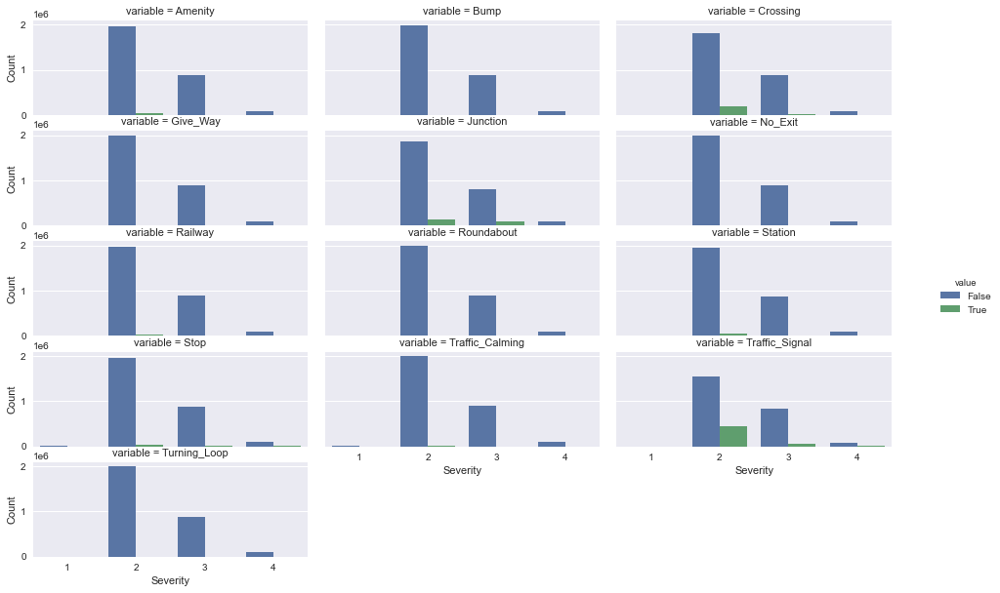

In [70]:
g = sns.catplot(x="Severity", y="Count",
            hue="value", col="variable",
            col_wrap=3, data=group_road, kind="bar",
            height=4, aspect=.7)
g.fig.set_figwidth(15)
g.fig.set_figheight(8)

Similiarly, the output below summarized the Trues and Falses by each variables grouped by Severity.

In [71]:
# Count of True and False of each road condition and group by Severity
(accident_road.set_index('Severity')
 .groupby(level='Severity')
# to do the count of columns nj, wd, wpt against the column ptype using 
# groupby + value_counts
 .apply(lambda g: g.apply(pd.value_counts))
 .unstack(level=1)
 .fillna(0))

Amenity              Bump        Crossing         Give_Way        \
            False  True       False  True     False   True     False True    
Severity                                                                     
1             949     19      968.0    0.0      881      87      967     1   
2         1961486  31924  1993007.0  403.0  1804143  189267  1987590  5820   
3          885196   2424   887573.0   47.0   873058   14562   886117  1503   
4           91484    853    92333.0    4.0    88663    3674    92034   303   

         Junction          ...  Station            Stop         \
            False   True   ...    False  True     False  True    
Severity                   ...                                   
1             955      13  ...      940     28      939     29   
2         1858206  135204  ...  1944914  48496  1956340  37070   
3          794803   92817  ...   880745   6875   885696   1924   
4           81924   10413  ...    91323   1014    91200   1137   

         Traffic_Calming        Traffic_Signal         Turning_Loop        
                   False  True           False   True         False True   
Severity                                                                   
1                  968.0    0.0            804     164        968.0   0.0  
2              1992459.0  951.0        1545539  447871    1993410.0   0.0  
3               887489.0  131.0         840139   47481     887620.0   0.0  
4                92308.0   29.0          84470    7867      92337.0   0.0  

[4 rows x 26 columns]

Using the `heatmap()` function from `seaborn` library, we want to know for each month, which day of the month are more likely to have more accidents.

From the heatmap below, we can see that more accidents are happening in the second half of the year and it looked like high accidents days are spead randomly and varied in each month.

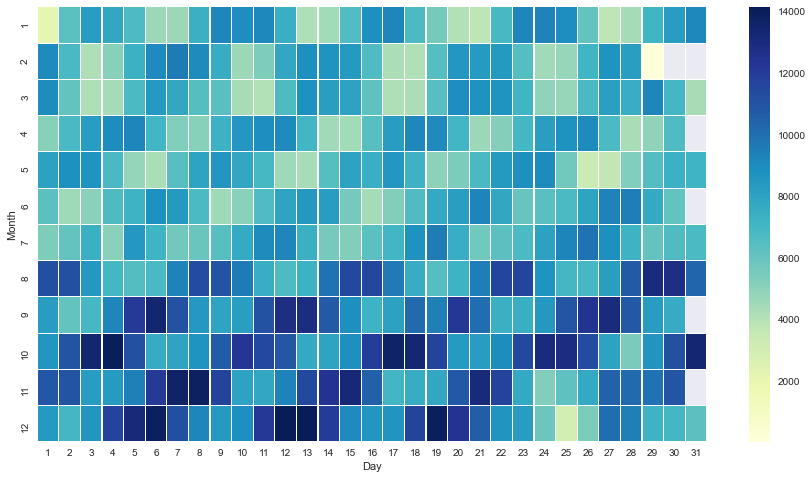

In [72]:
# More accidents are happening in the second half of the year
group_day = accident_clean.groupby(["Month","Day"]).size().unstack()
ax = sns.heatmap(group_day, cmap="YlGnBu",linewidths=0.1)

Similiarly, we want to see in what time of the day, more accidents will happen using a heatmap.

As expected, Most accidents happened between 7 and 8, which is the morning rush hour. Morning rush hour have much more accidents then the afternoon rush hour, which is 4 to 6 in the afternoon. This trend is observed consistently throughout each day of the month.

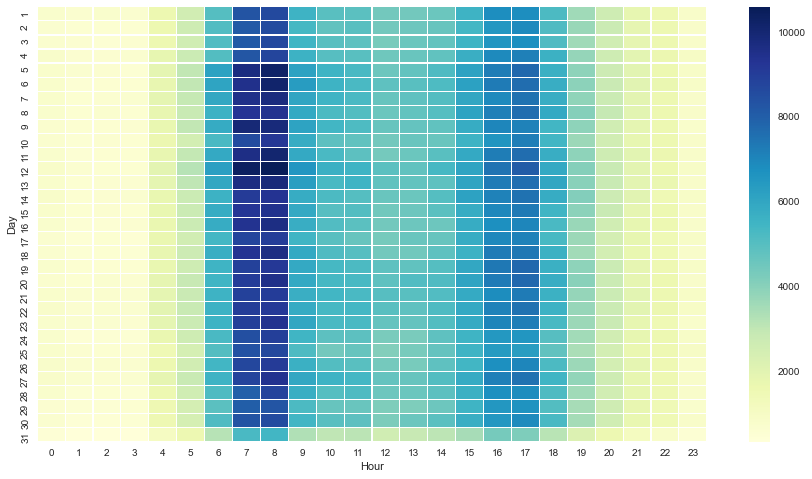

In [73]:
# Most accidents happened between 7 and 8, which is the morning rush hour
# morning rush hour have much more accidents then the afternoon rush hour, which is 4 to 6 in the afternoon

group_hour = accident_clean.groupby(["Day","Hour"]).size().unstack()
ax = sns.heatmap(group_hour, cmap="YlGnBu",linewidths=0.1)

After wrapping up the data visualization of numeric and categorical variables, we also want to visualiza geo data using a map.

The static map below are plot using `Basemap` from `mpl_toolkits`. The scatter plot is a good way to start.

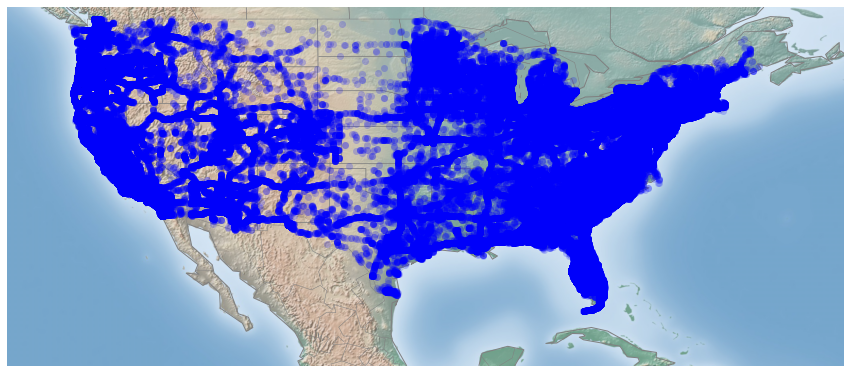

In [74]:
from mpl_toolkits.basemap import Basemap
import numpy as np
import matplotlib.pyplot as plt

# A basic map
# m=Basemap(llcrnrlon=-160, llcrnrlat=-75,urcrnrlon=160,urcrnrlat=80)
m = Basemap(llcrnrlat=20,urcrnrlat=50,llcrnrlon=-130,urcrnrlon=-60)

# m = Basemap(projection='lcc', resolution='h', lat_0=37.5, lon_0=-119,
#             width=1E6, height=1.2E6,
#            llcrnrlat=20,urcrnrlat=50,llcrnrlon=-130,urcrnrlon=-60)

m.shadedrelief()
m.drawcoastlines(color='gray') 
m.drawcountries(color='gray') 
m.drawstates(color='gray')

lat = accident_clean.Start_Lat.tolist()
lon = accident_clean.Start_Lng.tolist()

x,y = m(lon,lat)
m.plot(x,y,'bo',alpha = 0.2)

The next step is the plot a Choropleth map using `folium` library.

First download the US shape file from [US Census](https://www.census.gov/geographies/mapping-files/time-series/geo/carto-boundary-file.html). The shapefile used in this analysis are [state shape file](https://www2.census.gov/geo/tiger/GENZ2018/shp/cb_2018_us_state_500k.zip) and [zip code shape file](https://www2.census.gov/geo/tiger/GENZ2018/shp/cb_2018_us_zcta510_500k.zip).

We are using `geopandas` to load the shapefile, then `groupby()` state or zipcode and `merge()` to get the final dataset for map plotting.

In [75]:
# US Shape file from https://www2.census.gov/geo/tiger/GENZ2018/shp/cb_2018_us_state_500k.zip
shapefile_state = '/Users/leo/Personal/Python/cb_2018_us_state_500k/cb_2018_us_state_500k.shp'

#Read shapefile using Geopandas
gdf_state = gpd.read_file(shapefile_state)
gdf_state.head()

,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER,geometry
0,28,01779790,0400000US28,28,MS,Mississippi,00,121533519481,3926919758,"MULTIPOLYGON (((-88.50297 30.21523, -88.49176 ..."
1,37,01027616,0400000US37,37,NC,North Carolina,00,125923656064,13466071395,"MULTIPOLYGON (((-75.72681 35.93584, -75.71827 ..."
2,40,01102857,0400000US40,40,OK,Oklahoma,00,177662925723,3374587997,"POLYGON ((-103.00257 36.52659, -103.00219 36.6..."
3,51,01779803,0400000US51,51,VA,Virginia,00,102257717110,8528531774,"MULTIPOLYGON (((-75.74241 37.80835, -75.74151 ..."
4,54,01779805,0400000US54,54,WV,West Virginia,00,62266474513,489028543,"POLYGON ((-82.64320 38.16909, -82.64300 38.169..."


In [76]:
group_state = accident_clean.groupby(["State"]).agg(Count = ('ID','count'))
group_state.reset_index(level=0, inplace=True)
group_state[:5]

,State,Count
0,AL,36369
1,AR,1749
2,AZ,62330
3,CA,663204
4,CO,40124


In [77]:
# Merge shape file with accident data
state_map = gdf_state.merge(group_state, left_on = 'STUSPS', right_on = 'State')
state_map.head()

,STATEFP,STATENS,AFFGEOID,GEOID,STUSPS,NAME,LSAD,ALAND,AWATER,geometry,State,Count
0,28,01779790,0400000US28,28,MS,Mississippi,00,121533519481,3926919758,"MULTIPOLYGON (((-88.50297 30.21523, -88.49176 ...",MS,5961
1,37,01027616,0400000US37,37,NC,North Carolina,00,125923656064,13466071395,"MULTIPOLYGON (((-75.72681 35.93584, -75.71827 ...",NC,142460
2,40,01102857,0400000US40,40,OK,Oklahoma,00,177662925723,3374587997,"POLYGON ((-103.00257 36.52659, -103.00219 36.6...",OK,51297
3,51,01779803,0400000US51,51,VA,Virginia,00,102257717110,8528531774,"MULTIPOLYGON (((-75.74241 37.80835, -75.74151 ...",VA,79957
4,54,01779805,0400000US54,54,WV,West Virginia,00,62266474513,489028543,"POLYGON ((-82.64320 38.16909, -82.64300 38.169...",WV,2274


In [78]:
# group_state
m = folium.Map(location=[37, -102], zoom_start=4)

folium.TileLayer('CartoDB positron',name="Light Map",control=False).add_to(m)

# myscale = (state_map['Count'].quantile((0,0.2,0.4,0.6,0.8,1))).tolist()

m.choropleth(
    geo_data=state_map,
    name='Choropleth',
    data=state_map,
    columns=['State','Count'],
    key_on="feature.properties.State",
    fill_color='YlGnBu',
#     threshold_scale=myscale,
    fill_opacity=1,
    line_opacity=0.2,
    legend_name='Count of Accidents',
    smooth_factor=0
)


style_function = lambda x: {'fillColor': '#ffffff', 
                            'color':'#000000', 
                            'fillOpacity': 0.1, 
                            'weight': 0.1}
highlight_function = lambda x: {'fillColor': '#000000', 
                                'color':'#000000', 
                                'fillOpacity': 0.50, 
                                'weight': 0.1}

toolkit = folium.features.GeoJson(
    state_map,
    style_function=style_function, 
    control=False,
    highlight_function=highlight_function, 
    tooltip=folium.features.GeoJsonTooltip(
        fields=['State','Count'],
        aliases=['State: ','# of Accidents: '],
        style=("background-color: white; color: #333333; font-family: arial; font-size: 12px; padding: 10px;") 
    )
)

m.add_child(toolkit)
m.keep_in_front(toolkit)
folium.LayerControl().add_to(m)

m

Hover over each state will pop a toolkit that show the state name and the count of accidents. Most of the accidents in this dataset are in **California**, followed by **Texas** and **Florida**.

## Regression Analysis

After data visualization, we have a brief understanding of the dataset as well as the variables to choose for the regression analysis.

Since the dependent variable is **Severity**, which is a categorical variable. Logestic Regression model is chosen to perform the analysis.

The independent variables are selected based on the previous analysis:

- Distance(mi)
- Time_Diff
- Temperature(F)
- Wind_Chill(F)
- Humidity(%)
- Pressure(in)
- Visibility(mi)
- Wind_Speed(mph)
- Precipitation(in)

Using `sklearn` library, first separate the dependent variable **y** and independent variable **x** and store them in separate objects. The use `scale()` from `preprocessing` module to properly scale the **x** variable before the regression.

Next step will be using `train_test_split` from `sklearn.model_selection` module to split test and train dataset. Finally fit the logestic regression model.

In [79]:
variable = ["Severity","Distance(mi)","Time_Diff","Temperature(F)","Wind_Chill(F)","Humidity(%)",
           "Pressure(in)","Visibility(mi)","Wind_Speed(mph)","Precipitation(in)"]
accident_model = accident_clean[variable]
accident_model = accident_model.dropna()
# accident_model['Severity'] = np.where(accident_model['Severity']<=2, 0, 1)
accident_model.head()

,Severity,Distance(mi),Time_Diff,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
5,3,0.01,30.0,37.9,35.5,97.0,29.63,7.0,3.5,0.03
9,3,0.01,30.0,37.4,33.8,100.0,29.62,3.0,4.6,0.02
11,3,0.01,30.0,37.4,33.8,100.0,29.62,3.0,4.6,0.02
14,2,0.01,30.0,37.4,33.8,100.0,29.62,3.0,4.6,0.02
20,2,0.00,30.0,33.8,29.6,100.0,29.62,2.0,4.6,0.01


In [80]:
Y = accident_model.loc[:,'Severity'].values
X = accident_model.loc[:,'Distance(mi)':'Precipitation(in)'].values

standardized_X = preprocessing.scale(X)
train_x, test_x, train_y, test_y = train_test_split(standardized_X,Y , test_size=0.3, random_state=0)

model = LogisticRegression(solver='lbfgs',multi_class='multinomial',max_iter=1000)
model.fit(train_x, train_y)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='multinomial', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

Use `score()` to evaluate the model, the model gets 0.72, which is decent for the first try.

In [81]:
model.score(test_x, test_y)

0.7217624854819977

Finally use `confusion_matrix` to see how many of the prediction are correct and how many are incorrect.

We can see that **Severity 2 and 3** are the most accidents. The model did a good job in identifing **Severity 2** but not **Severity 3**.

Text(316.06, 0.5, 'true value')

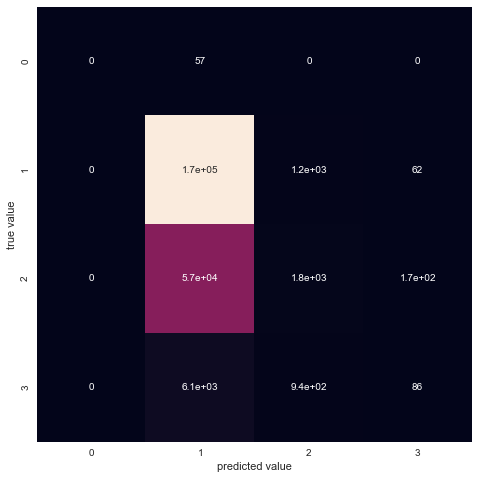

In [82]:
model_y = model.predict(test_x)

mat = confusion_matrix(test_y,model_y)
sns.heatmap(mat, square=True, annot=True, cbar=False) 
plt.xlabel('predicted value')
plt.ylabel('true value')